**Mobile Price Classification**

The goal of this project is to predict the price range of mobile phones (0 to 3) based on key hardware specifications and features using a supervised classification approach.

0 (low cost)
1 (medium cost)
2 (high cost)
3 (very high cost)


GitHub Repository: https://github.com/pooja-vinod/portfolio_mpc

DagsHub Repository: https://dagshub.com/pooja-vinod/Machile_learning_Project

MLFlow Experiments: https://dagshub.com/pooja-vinod/Machile_learning_Project/experiments

DockerHub Repository: https://hub.docker.com/repository/docker/poojavinod/mobile-price-classification/general

Deployed Model (FastAPI): https://sea-lion-app-rea3s.ondigitalocean.app/docs#/default/predict_predict_post

Streamlit App: https://mobile-price-classification-kvi3kjwfhnjkdfffwsqhgz.streamlit.app/

Video Link: https://buffalo.box.com/s/g54stvlw78esnfd72ojihendzfxz3e9g

**Tools and Technologies Used**

Python: For data preprocessing, model training, and evaluation.

SQLite3: For normalized database storage and query management.

Numpy & Pandas: For data manipulation and analysis.

Scikit-learn: For machine learning models and evaluation metrics.

DagsHub & MLFlow: For experiment tracking and model performance logging.

Docker: For containerizing the API.

Streamlit: For deploying an interactive web application.


***Dataset link and normalized database structure***


Final Data : https://raw.githubusercontent.com/amankharwal/Website-data/master/mobile_prices.csv

Piazza Link : https://piazza.com/class/m0cm60rbd2kaq/post/133

First Step:

Normalization of CSV File


1.   **Create Tables for Each Entity/Concept:**

*   **Mobile**: Contains information about general phone features.
*   **Features**: Stores specific boolean features such as Dual SIM, 4G, and WiFi support.
*   **Specifications**: Stores numerical specifications like RAM, battery power, and processor details.

2.   **Define Relationships:**


*   Mobile has one-to-one relationships with Features and Specifications.


**Database Structure**


**Mobile Table:**

*   mobile_id (Primary Key)
*   price_range (Target variable)

*   battery_power
*   mobile_weight

**Features Table:**

*   mobile_id (Primary Key, Foreign Key to Mobile)

*   dual_sim
*   four_g


*   three_g


*   touch_screen

*   wifi

*   bluetooth

**Specifications Table:**


*   mobile_id (Primary Key, Foreign Key to Mobile)

*   clock_speed

*   internal_memory
*   n_cores


*   pixel_height


*   pixel_width

*   ram

**Normalization**

**Mobile Table**:

Stores general information like battery power, weight, and target variable (price_range).

**Features Table**:

Stores boolean features such as dual_sim, four_g, and wifi.

**Specifications Table**:

Stores hardware specifications like processor speed, internal memory, screen resolution, and RAM.

Each mobile phone record in the Mobile table references related data in the Features and Specifications tables via the mobile_id foreign key.


**SQL DDL Statements**

1. Create Mobile Table:


```
CREATE TABLE Mobile (
    mobile_id INT PRIMARY KEY,  -- Unique identifier for each mobile
    battery_power INT,          -- Battery capacity in mAh
    mobile_weight INT,          -- Mobile weight in grams
    price_range INT             -- Target variable: 0 (lowest) to 3 (highest)
);
```

2. Create Features Table:


```
CREATE TABLE Features (
    mobile_id INT PRIMARY KEY,  -- Foreign key referencing Mobile(mobile_id)
    dual_sim BOOLEAN,           -- Supports dual SIM (0: No, 1: Yes)
    four_g BOOLEAN,             -- Supports 4G (0: No, 1: Yes)
    three_g BOOLEAN,            -- Supports 3G (0: No, 1: Yes)
    touch_screen BOOLEAN,       -- Has a touch screen (0: No, 1: Yes)
    wifi BOOLEAN,               -- Supports WiFi (0: No, 1: Yes)
    bluetooth BOOLEAN,          -- Supports Bluetooth (0: No, 1: Yes)
    FOREIGN KEY (mobile_id) REFERENCES Mobile(mobile_id)
);
```

3. Create Specifications Table:

```
CREATE TABLE Specifications (
    mobile_id INT PRIMARY KEY,  -- Foreign key referencing Mobile(mobile_id)
    clock_speed FLOAT,          -- Processor clock speed in GHz
    internal_memory INT,        -- Internal memory in GB
    n_cores INT,                -- Number of processor cores
    pixel_height INT,           -- Screen pixel height
    pixel_width INT,            -- Screen pixel width
    ram INT,                    -- RAM in MB
    FOREIGN KEY (mobile_id) REFERENCES Mobile(mobile_id)
);
```





In [ ]:
# !pip install pandas
# !pip install scikit-learn
# !pip install ydata-profiling

#!pip install pandas-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 82.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=629c360be86cc7ebd4185abc36a88789005c267901dd9db8e0bf7801e0d62d81
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.8 MB/s eta 0:00:00


In [ ]:
#!pip install pydantic-settings
#!pip install --upgrade pandas-profiling
#!pip install pandas_profiling==3.2.0 pydantic==1.10.2
#!pip uninstall -y pandas-profiling
# !pip install ydata-profiling
#!pip install -U pandas-profiling
%load_ext sql

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.0/140.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 262.6/262.6 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 79.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 81.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.8/309.8 kB 21.0 MB/s eta 0:00:00
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.10.3
    Uninstalling pydantic-2.10.3:
      Successfully uninstalled pydantic-2.10.3
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
  Attempting uninstall: joblib
    Found existing installation: joblib 1.4.2
    Uninstalling joblib-1.4.2:
      Successfully uninstalled joblib-1.4.2
  Attempting uninstall: visions
    F

**Script for performing normalization with missing data kept as NULL**

In [ ]:
import sqlite3
import csv

# Connect to the database (this will create the database file if it doesn't exist)
conn = sqlite3.connect("mobile_project.db")
cur = conn.cursor()

# Define SQL statements to drop tables if they exist
drop_table_queries = [
    "DROP TABLE IF EXISTS Mobiles",
    "DROP TABLE IF EXISTS Features",
    "DROP TABLE IF EXISTS Specifications"
]

# Execute drop table queries
for query in drop_table_queries:
    cur.execute(query)

# Define SQL statements to create tables
create_table_queries = [
    """
    CREATE TABLE IF NOT EXISTS Mobiles (
        MobileID INTEGER PRIMARY KEY AUTOINCREMENT NOT NULL,
        BatteryPower INTEGER NOT NULL,
        MobileWeight INTEGER NOT NULL,
        PriceRange INTEGER NOT NULL
    )
    """,
    """
    CREATE TABLE IF NOT EXISTS Features (
        MobileID INTEGER PRIMARY KEY NOT NULL,
        DualSim INTEGER NOT NULL,
        FourG INTEGER NOT NULL,
        ThreeG INTEGER NOT NULL,
        TouchScreen INTEGER NOT NULL,
        Wifi INTEGER NOT NULL,
        Bluetooth INTEGER NOT NULL,
        FOREIGN KEY (MobileID) REFERENCES Mobiles (MobileID)
    )
    """,
    """
    CREATE TABLE IF NOT EXISTS Specifications (
        MobileID INTEGER PRIMARY KEY NOT NULL,
        ClockSpeed REAL NOT NULL,
        IntMemory INTEGER NOT NULL,
        NCores INTEGER NOT NULL,
        PxHeight INTEGER NOT NULL,
        PxWidth INTEGER NOT NULL,
        RAM INTEGER NOT NULL,
        FOREIGN KEY (MobileID) REFERENCES Mobiles (MobileID)
    )
    """
]

# Execute table creation queries
for query in create_table_queries:
    cur.execute(query)

# Commit table creation
conn.commit()

# Read and insert data into tables
with open('/mnt/mobile_prices.csv', 'r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        # Insert into Mobiles
        cur.execute("""
            INSERT INTO Mobiles (BatteryPower, MobileWeight, PriceRange)
            VALUES (?, ?, ?)
        """, (row['battery_power'], row['mobile_wt'], row['price_range']))

        mobile_id = cur.lastrowid  # Get the last inserted MobileID

        # Insert into Features
        cur.execute("""
            INSERT INTO Features (MobileID, DualSim, FourG, ThreeG, TouchScreen, Wifi, Bluetooth)
            VALUES (?, ?, ?, ?, ?, ?, ?)
        """, (mobile_id, row['dual_sim'], row['four_g'], row['three_g'],
                row['touch_screen'], row['wifi'], row['blue']))

        # Insert into Specifications
        cur.execute("""
            INSERT INTO Specifications (MobileID, ClockSpeed, IntMemory, NCores, PxHeight, PxWidth, RAM)
            VALUES (?, ?, ?, ?, ?, ?, ?)
        """, (mobile_id, row['clock_speed'], row['int_memory'], row['n_cores'],
                row['px_height'], row['px_width'], row['ram']))

# Commit data insertion and close connection
conn.commit()
cur.close()
conn.close()

print("Table creation and data insertion completed.")


Table creation and data insertion completed.


***Load necessary data with joins , check the intital structure and missing values***

In [ ]:
import pandas as pd
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('mobile_project.db')

# Write SQL query using joins to fetch data
query = """
SELECT
    m.BatteryPower, m.MobileWeight, m.PriceRange,
    f.DualSim, f.FourG, f.ThreeG, f.TouchScreen, f.Wifi, f.Bluetooth,
    s.ClockSpeed, s.IntMemory, s.NCores, s.PxHeight, s.PxWidth, s.RAM
FROM Mobiles m
LEFT JOIN Features f ON m.MobileID = f.MobileID
LEFT JOIN Specifications s ON m.MobileID = s.MobileID
"""

# Fetch data into Pandas DataFrame
df = pd.read_sql_query(query, conn)

# Display the DataFrame to check if it contains data
print(df.head())  # Display the first few rows
print(df.shape)  # Display the shape of the DataFrame (rows x columns)

# Check for null and missing values
print('Null and Missing Values:')
null_values = df.isnull() | (df == 'None')
missing_values = df.isna().sum()
print(null_values)
print(missing_values)

# Close the database connection
conn.close()


   BatteryPower  MobileWeight  PriceRange  DualSim  FourG  ThreeG  \
0           842           188           1        0      0       0   
1          1021           136           2        1      1       1   
2           563           145           2        1      1       1   
3           615           131           2        0      0       1   
4          1821           141           1        0      1       1   

   TouchScreen  Wifi  Bluetooth  ClockSpeed  IntMemory  NCores  PxHeight  \
0            0     1          0         2.2          7       2        20   
1            1     0          1         0.5         53       3       905   
2            1     0          1         0.5         41       5      1263   
3            0     0          1         2.5         10       6      1216   
4            1     0          1         1.2         44       2      1208   

   PxWidth   RAM  
0      756  2549  
1     1988  2631  
2     1716  2603  
3     1786  2769  
4     1212  1411  
(1073, 15)
Nul

In [ ]:
!pip uninstall joblib
!pip install joblib


Found existing installation: joblib 1.4.2
Uninstalling joblib-1.4.2:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/joblib-1.4.2.dist-info/*
    /usr/local/lib/python3.10/dist-packages/joblib/*
Proceed (Y/n)? y
  Successfully uninstalled joblib-1.4.2
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)


**Split the data into test and training set and peform imabalance check based on income variable**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('mobile_project.db')

# Query to fetch data
query = """
SELECT
    m.BatteryPower, m.MobileWeight,
    f.DualSim, f.FourG, f.ThreeG, f.TouchScreen, f.Wifi, f.Bluetooth,
    s.ClockSpeed, s.IntMemory, s.NCores, s.PxHeight, s.PxWidth, s.RAM,
    m.PriceRange
FROM Mobiles m
LEFT JOIN Features f ON m.MobileID = f.MobileID
LEFT JOIN Specifications s ON m.MobileID = s.MobileID
"""

# Load the data into a Pandas DataFrame
df = pd.read_sql_query(query, conn)
conn.close()

# Define features (X) and target (y)
x = df.drop('PriceRange', axis=1)  # Features
y = df['PriceRange']  # Target variable

# split - Split 80% training/validation into 80% training and 20% validation
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

# Check the sizes of the splits
print("Training set size:", x_train.shape)

print("Testing set size:", x_test.shape)

# Check class imbalance in the training set
print("\nTraining set class distribution:")
print(y_train.value_counts())



# Check class imbalance in the testing set
print("\nTesting set class distribution:")
print(y_test.value_counts())


Training set size: (858, 14)
Testing set size: (215, 14)

Training set class distribution:
PriceRange
3    233
0    214
2    211
1    200
Name: count, dtype: int64

Testing set class distribution:
PriceRange
3    59
2    53
0    53
1    50
Name: count, dtype: int64


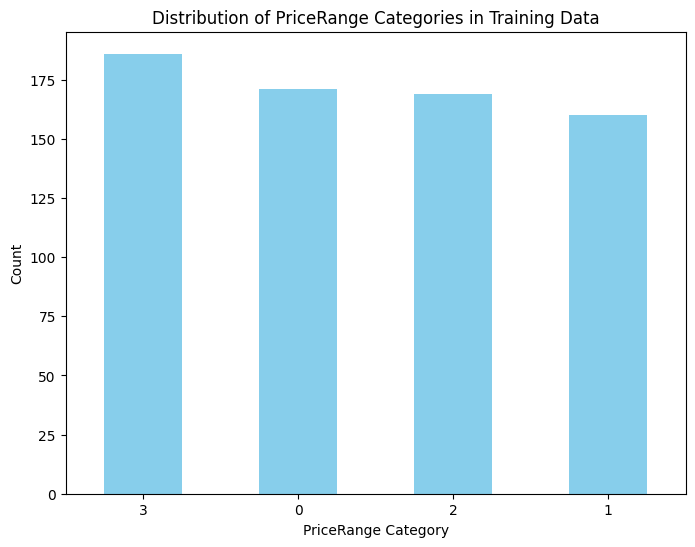

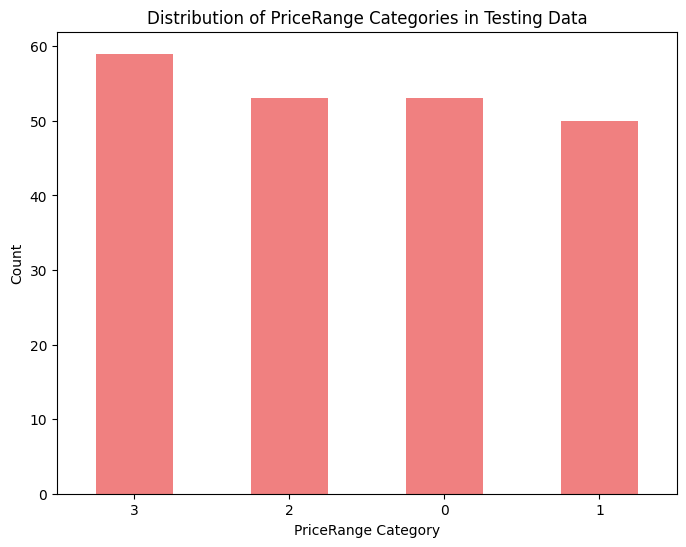

In [ ]:
import matplotlib.pyplot as plt

# Count the occurrences of each PriceRange category in the training data
price_range_counts = y_train.value_counts()

# Plot the distribution
plt.figure(figsize=(8, 6))
price_range_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of PriceRange Categories in Training Data')
plt.xlabel('PriceRange Category')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
plt.show()

# For the testing data
price_range_counts_test = y_test.value_counts()

# Plot the distribution for testing data
plt.figure(figsize=(8, 6))
price_range_counts_test.plot(kind='bar', color='lightcoral')
plt.title('Distribution of PriceRange Categories in Testing Data')
plt.xlabel('PriceRange Category')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
plt.show()


In [ ]:
duplicate_labels = df.columns[df.columns.duplicated()]

# Print the duplicate column names
print("Duplicate Columns:")
print(duplicate_labels)

Duplicate Columns:
Index([], dtype='object')


In [ ]:
!pip list
!pip uninstall pydantic-settings
!pip install --upgrade joblib

Package                            Version
---------------------------------- --------------------
absl-py                            1.4.0
accelerate                         1.2.1
aiohappyeyeballs                   2.4.4
aiohttp                            3.11.10
aiosignal                          1.3.2
alabaster                          1.0.0
albucore                           0.0.19
albumentations                     1.4.20
altair                             5.5.0
annotated-types                    0.7.0
anyio                              3.7.1
argon2-cffi                        23.1.0
argon2-cffi-bindings               21.2.0
array_record                       0.5.1
arviz                              0.20.0
astropy                            6.1.7
astropy-iers-data                  0.2024.12.16.0.35.48
astunparse                         1.6.3
async-timeout                      4.0.3
atpublic                           4.1.0
attrs                              24.3.0
audioread        

In [ ]:
#!pip uninstall pandas-profiling joblib visions
#!pip install pandas-profiling==3.2.0 joblib==1.1.0 visions[type_image_path]==0.7.4
#!pip uninstall pandas-profiling ydata-profiling joblib visions
!pip install joblib>=1.2.0
!pip install visions[type_image_path]>=0.7.5,<0.7.7
!pip install ydata-profiling==4.12.1

#!pip install pandas-profiling==3.2.0
#!pip install pydantic==1.10.9


/bin/bash: line 1: 0.7.7: No such file or directory
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 13.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=dfc8944a4ee6a5d410c9800b84968d97b7676c5b1cf523f3443ff103e926f3f5
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


***Perform Exploratory Data Analysis on the training data with Ydata Profiling library***

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport

# Assuming df is your DataFrame containing the data

# Check for duplicate labels in the DataFrame
duplicate_labels = df.columns.duplicated()
print("Duplicate Labels:")
print(duplicate_labels)

# Drop duplicates if necessary
df_no_duplicates = df.loc[:, ~df.columns.duplicated()]

# Perform train/test split with stratification on the DataFrame without duplicates
x_train, x_test, y_train, y_test = train_test_split(
    df_no_duplicates.drop('PriceRange', axis=1),
    df_no_duplicates['PriceRange'],
    test_size=0.2,
    stratify=df_no_duplicates['PriceRange'],
    random_state=42
)

# Generate a profile report for the training data without duplicates
profile = ProfileReport(x_train)
profile.to_notebook_iframe()  # Uncomment this for Jupyter Notebook environments


Duplicate Labels:
[False False False False False False False False False False False False
 False False False]


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***Plot the feature correlation heatmap with correlation values displayed using Seaborn***

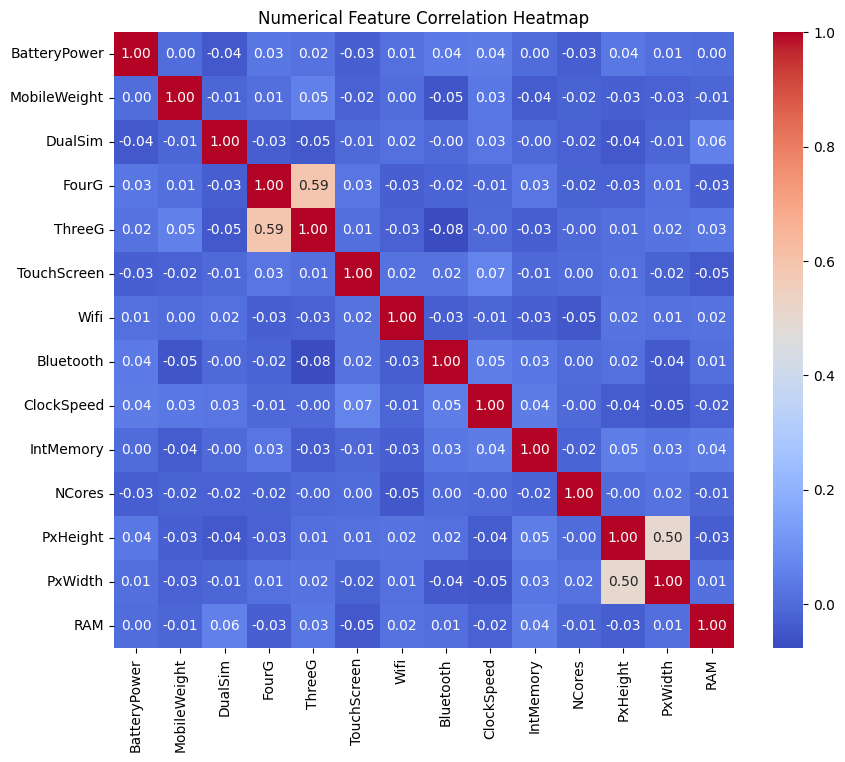

Pair Plots


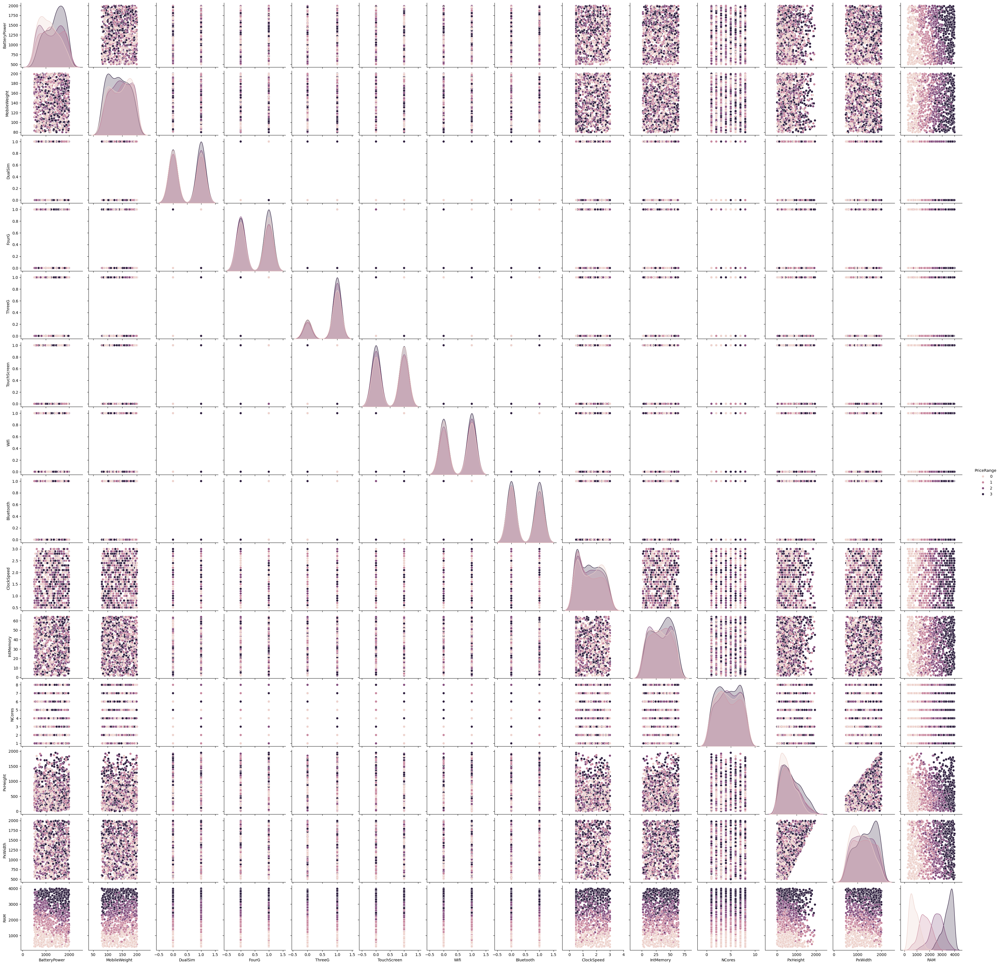

NameError: name 'df_no_duplicates' is not defined

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# All columns except the target variable
all_cols_except_target = df.columns[df.columns != 'PriceRange']

# Identify categorical columns based on their data types
categorical_cols = df[all_cols_except_target].select_dtypes(include='object').columns.tolist()

# Identify numerical columns based on their data types
numerical_cols = df[all_cols_except_target].select_dtypes(include=['int64', 'float64']).columns.tolist()

# Calculate correlation matrix for numerical columns
corr_matrix = x_train[numerical_cols].corr()

# Plot feature correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Numerical Feature Correlation Heatmap")
plt.show()

# Pair Plots
bold_text = "\033[1mPair Plots\033[0m"
print(bold_text)

sns.pairplot(df, hue='PriceRange', diag_kind='kde')
plt.show()

# Check the distribution of PriceRange categories
print(df_no_duplicates['PriceRange'].value_counts())


Finding Categorical columns in this dataset

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Identify categorical columns (if any exist)
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Check if categorical columns exist
if categorical_cols:
    for col in categorical_cols:
        plt.figure(figsize=(8, 6))
        sns.violinplot(x='PriceRange', y=col, data=df, inner='quartile', palette='muted')
        plt.title(f'Violin Plot of {col} Grouped by PriceRange')
        plt.xlabel('PriceRange')
        plt.ylabel(col)
        plt.show()
else:
    print("No categorical columns found in the dataset.")


No categorical columns found in the dataset.


outliers

In [ ]:
from scipy.stats import zscore

# Calculate z-scores for numerical columns
z_scores = df[numerical_cols].apply(zscore)

# Identify outliers (absolute z-score > 3)
outliers = (z_scores.abs() > 3)

# Count and display outliers for each column
print("Number of outliers detected using Z-score:")
print(outliers.sum())

# Display rows with outliers
outlier_rows = df[outliers.any(axis=1)]
print("\nRows with outliers:")
print(outlier_rows)


Number of outliers detected using Z-score:
BatteryPower    0
MobileWeight    0
DualSim         0
FourG           0
ThreeG          0
TouchScreen     0
Wifi            0
Bluetooth       0
ClockSpeed      0
IntMemory       0
NCores          0
PxHeight        0
PxWidth         0
RAM             0
dtype: int64

Rows with outliers:
Empty DataFrame
Columns: [BatteryPower, MobileWeight, DualSim, FourG, ThreeG, TouchScreen, Wifi, Bluetooth, ClockSpeed, IntMemory, NCores, PxHeight, PxWidth, RAM, PriceRange]
Index: []


In [ ]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assume 'df' is your dataset and 'PriceRange' is the target variable
X = df.drop('PriceRange', axis=1)  # Features
y = df['PriceRange']  # Target variable

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply VarianceThreshold
# Set a threshold for variance (e.g., 0.01)
selector = VarianceThreshold(threshold=0.01)
X_selected = selector.fit_transform(X_scaled)

# Get the remaining feature names
remaining_columns = X.columns[selector.get_support()]

# Create a new DataFrame with selected features
X_selected_df = pd.DataFrame(X_selected, columns=remaining_columns)

# Combine the standardized and filtered features with the target variable for a new DataFrame
df_final = pd.concat([X_selected_df, y.reset_index(drop=True)], axis=1)

# Output results
print("Original Features:")
print(X.columns.tolist())
print("\nFeatures Remaining After Applying Variance Threshold:")
print(remaining_columns.tolist())


Original Features:
['BatteryPower', 'MobileWeight', 'DualSim', 'FourG', 'ThreeG', 'TouchScreen', 'Wifi', 'Bluetooth', 'ClockSpeed', 'IntMemory', 'NCores', 'PxHeight', 'PxWidth', 'RAM']

Features Remaining After Applying Variance Threshold:
['BatteryPower', 'MobileWeight', 'DualSim', 'FourG', 'ThreeG', 'TouchScreen', 'Wifi', 'Bluetooth', 'ClockSpeed', 'IntMemory', 'NCores', 'PxHeight', 'PxWidth', 'RAM']


In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import pandas as pd
import numpy as np

class Preprocessor:
    def __init__(self):
        self.imputer = SimpleImputer(strategy='mean')  # For handling missing values in numerical columns
        self.scaler = StandardScaler()  # For standardizing numerical data
        self.minmax_scaler = MinMaxScaler()  # For min-max scaling specific features

    def transform(self, df, numerical_cols_to_scale, log_transform_cols, minmax_scale_cols):
        # Handle missing values using SimpleImputer with mean strategy
        imputed_data = self.imputer.fit_transform(df)
        df_imputed = pd.DataFrame(imputed_data, columns=df.columns)

        # Apply log transformation to specified columns to address skewness
        for col in log_transform_cols:
            df_imputed[col] = np.log1p(df_imputed[col])  # log(1+x) to handle zeros safely

        # Apply StandardScaler to selected numerical columns
        df_imputed[numerical_cols_to_scale] = self.scaler.fit_transform(df_imputed[numerical_cols_to_scale])

        # Apply Min-Max Scaling to specific numerical columns
        df_imputed[minmax_scale_cols] = self.minmax_scaler.fit_transform(df_imputed[minmax_scale_cols])

        return df_imputed

"""# Example usage:
# Load your DataFrame
# df = pd.read_csv('your_dataset.csv')

preprocessor = Preprocessor()

# Define numerical columns to scale
numerical_cols_to_scale = ['BatteryPower', 'RAM', 'ClockSpeed']

# Define columns for log transformation
log_transform_cols = ['BatteryPower', 'RAM']  # Apply log to columns prone to skewness

# Define columns for Min-Max Scaling
minmax_scale_cols = ['MobileWeight']  # Columns for Min-Max Scaling

# Preprocess the data
df_processed = preprocessor.transform(df, numerical_cols_to_scale, log_transform_cols, minmax_scale_cols)

# Output the preprocessed DataFrame
print(df_processed.head())"""


"# Example usage:\n# Load your DataFrame\n# df = pd.read_csv('your_dataset.csv')\n\npreprocessor = Preprocessor()\n\n# Define numerical columns to scale\nnumerical_cols_to_scale = ['BatteryPower', 'RAM', 'ClockSpeed']\n\n# Define columns for log transformation\nlog_transform_cols = ['BatteryPower', 'RAM']  # Apply log to columns prone to skewness\n\n# Define columns for Min-Max Scaling\nminmax_scale_cols = ['MobileWeight']  # Columns for Min-Max Scaling\n\n# Preprocess the data\ndf_processed = preprocessor.transform(df, numerical_cols_to_scale, log_transform_cols, minmax_scale_cols)\n\n# Output the preprocessed DataFrame\nprint(df_processed.head())"

## **Create a pipeline with preprocessor and other data manipulation and models**

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
import numpy as np

#
# Log transformation function
def log_transform(x):
    return np.log1p(x)

# Define the preprocessing pipeline
num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="mean")),  # Handle missing values with mean imputation
    ("log_transform", FunctionTransformer(log_transform)),  # Apply log transformation
    ("standardize", StandardScaler()),  # Standardize numerical features
])

# Combine preprocessing and classifier into a pipeline
model = LogisticRegression(max_iter=2000, solver='lbfgs')
pipeline = Pipeline(steps=[
    ('preprocessor', num_pipeline),
    ('classifier', model)
])


# Fit the pipeline
pipeline.fit(x_train, y_train)



Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('impute', SimpleImputer()),
                                 ('log_transform',
                                  FunctionTransformer(func=<function log_transform at 0x7928d939c9d0>)),
                                 ('standardize', StandardScaler())])),
                ('classifier', LogisticRegression(max_iter=2000))])

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import mlflow
from mlflow.models import infer_signature

# Log transformation function
def log_transform(x):
    return np.log1p(x)

# Define the preprocessing pipeline
num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="mean")),  # Handle missing values with mean imputation
    ("log_transform", FunctionTransformer(log_transform)),  # Apply log transformation
    ("standardize", StandardScaler()),  # Standardize numerical features
])

# Combine preprocessing and classifier into a pipeline
model = LogisticRegression(max_iter=2000, solver='lbfgs')
pipeline = Pipeline(steps=[
    ('preprocessor', num_pipeline),
    ('classifier', model)
])

# Fit the pipeline on the training data
pipeline.fit(x_train, y_train)

# Predict on the test set
y_pred = pipeline.predict(X_test)
y_pred_proba = pipeline.predict_proba(X_test)

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred, labels=model.classes_)

# Generate classification report
class_report = classification_report(y_test, y_pred, output_dict=True)
f1_scores = {f"F1_Score_Class_{cls}": class_report[str(cls)]['f1-score'] for cls in model.classes_}

# Log model and metrics with MLFlow
mlflow.set_tag("Training", "Logistic Regression with Preprocessing Pipeline")
signature = infer_signature(x_train, y_pred)
mlflow.sklearn.log_model(
    sk_model=pipeline,
    artifact_path="PriceRangeClassification_Model",
    signature=signature,
    input_example=x_train,
    registered_model_name="Logistic_Regression_Model"
)

# Log F1 scores for each class
for cls, f1 in f1_scores.items():
    mlflow.log_metric(cls, f1)

# Log confusion matrix
for i, row in enumerate(conf_matrix):
    for j, value in enumerate(row):
        mlflow.log_metric(f"Confusion_Matrix_Class_{i}_Pred_{j}", value)

# Display results
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


ModuleNotFoundError: No module named 'mlflow'

In [ ]:
#!pip install -q dagshub mlflow
#!pip install dacite>=1.8 --upgrade

import os
"""
import os
import mlflow

# Set DagsHub MLFlow tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'pooja-vinod'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'bba8089aa28d2b50ce89d9db7c2c932605e11f12'

# Set MLFlow tracking URI
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Test the connection
try:
    client = mlflow.tracking.MlflowClient()
    print("Connected to MLFlow Tracking Server.")
    print(f"Tracking URI: {mlflow.get_tracking_uri()}")
except Exception as e:
    print("Failed to connect to MLFlow Tracking Server.")
    print(str(e))

# Experiment name to test
experiment_name = "test_experiment"

try:
    # Check if the experiment exists
    experiment_id = mlflow.get_experiment_by_name(experiment_name)
    if experiment_id is None:
        # Create the experiment
        experiment_id = mlflow.create_experiment(experiment_name)
        print(f"Experiment '{experiment_name}' created successfully with ID: {experiment_id}")
    else:
        print(f"Experiment '{experiment_name}' already exists with ID: {experiment_id.experiment_id}")
except Exception as e:
    print("Failed to create or check experiment.")
    print(str(e))"""


# Set DagsHub MLFlow tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'pooja-vinod'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'bba8089aa28d2b50ce89d9db7c2c932605e11f12'



'0056c8fac3282075a1cb3f5be1bd713846f46372'

In [ ]:
import os
import mlflow
from mlflow.models import infer_signature
from sklearn.metrics import confusion_matrix, f1_score


# Set MLFlow tracking URI
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Experiment details
experiment_name = "Mobile Price Classification"
experiment_id = mlflow.get_experiment_by_name(experiment_name)

if experiment_id is None:
    mlflow.create_experiment(experiment_name)
    print(f"Created experiment: {experiment_name}")
else:
    print(f"Using existing experiment: {experiment_name}")

# Set the experiment
mlflow.set_experiment(experiment_name)
# Start a new MLFlow run
with mlflow.start_run():
    # Set tags for metadata
    mlflow.set_tag("model_type", "Logistic Regression")
    mlflow.set_tag("data_split", "80-20 Train-Test")
    mlflow.set_tag("description", "Pipeline with preprocessing and logistic regression")

    # Train the pipeline
    pipeline.fit(x_train, y_train)

    # Predict on test set
    y_pred = pipeline.predict(x_test)
    y_pred_proba = pipeline.predict_proba(x_test)

    # Log model parameters
    mlflow.log_param("max_iter", 2000)

    # Log metrics
    f1 = f1_score(y_test, y_pred, average='weighted')
    mlflow.log_metric("F1_Score_Weighted", f1)

    # Log confusion matrix metrics
    conf_matrix = confusion_matrix(y_test, y_pred)
    for i, row in enumerate(conf_matrix):
        for j, value in enumerate(row):
            mlflow.log_metric(f"Confusion_Matrix_Class_{i}_Pred_{j}", value)

    # Infer model signature
    signature = infer_signature(x_train, pipeline.predict(x_train))

    # Log the entire pipeline model
    mlflow.sklearn.log_model(
        sk_model=pipeline,
        artifact_path="PriceRange_Classification_Model",
        signature=signature,
        input_example=x_train,
        registered_model_name="Logistic_Regression_Pipeline"
    )

    # Print confirmation
    print("Pipeline and model logged successfully!")


Using existing experiment: Mobile Price Classification


/usr/local/lib/python3.10/dist-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Logistic_Regression_Pipeline' already exists. Creating a new version of this model...
2024/12/20 23:22:48 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name:

Pipeline and model logged successfully!
🏃 View run loud-bee-526 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/1/runs/3e992c52357d4b929c47c86fcf04966c
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/1


In [ ]:
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, f1_score, accuracy_score
from sklearn.pipeline import Pipeline
import numpy as np
import mlflow
from mlflow.models import infer_signature

# Define the logistic regression pipeline
pipeline = Pipeline([
    ('classifier', LogisticRegression(solver='lbfgs', max_iter=1000, multi_class='multinomial'))
])

# Define hyperparameters for tuning
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10],  # Regularization strength
    'classifier__penalty': ['l2']  # Penalty (l1/l2)
}

# Define the scoring metrics
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'f1_weighted': make_scorer(f1_score, average='weighted')
}

# Perform GridSearchCV with cross-validation (3/10 folds)
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring=scoring,
    refit='accuracy',  # Use accuracy as the metric for selecting the best model
    cv=10,  # Change to 3 for 3-fold cross-validation
    verbose=1,
    return_train_score=True
)

# Start MLFlow run
mlflow.set_experiment("logistic_regression")
with mlflow.start_run():
    # Train GridSearchCV
    grid_search.fit(x_train, y_train)

    # Get cross-validation results
    cv_results = grid_search.cv_results_

    # Extract mean and standard deviation of CV scores
    mean_test_scores = cv_results['mean_test_accuracy']
    std_test_scores = cv_results['std_test_accuracy']
    mean_f1_scores = cv_results['mean_test_f1_weighted']
    std_f1_scores = cv_results['std_test_f1_weighted']

    # Log the best parameters
    mlflow.log_params(grid_search.best_params_)

    # Log cross-validation metrics
    mlflow.log_metric("mean_cv_accuracy", np.mean(mean_test_scores))
    mlflow.log_metric("std_cv_accuracy", np.std(std_test_scores))
    mlflow.log_metric("mean_cv_f1", np.mean(mean_f1_scores))
    mlflow.log_metric("std_cv_f1", np.std(std_f1_scores))

    # Evaluate on the whole training data using the best model
    best_model = grid_search.best_estimator_
    train_accuracy = accuracy_score(y_train, best_model.predict(x_train))
    train_f1 = f1_score(y_train, best_model.predict(x_train), average='weighted')

    # Log training data metrics
    mlflow.log_metric("train_accuracy", train_accuracy)
    mlflow.log_metric("train_f1", train_f1)

    # Infer signature and log the model
    signature = infer_signature(x_train, best_model.predict(x_train))
    mlflow.sklearn.log_model(
        sk_model=best_model,
        artifact_path="LogisticRegression_Model",
        signature=signature,
        input_example=x_train,
        registered_model_name="Logistic_Regression_CV_Model"
    )

    # Print summary
    print("Best Parameters:", grid_search.best_params_)
    print("Best Accuracy Score:", grid_search.best_score_)
    print("\nCross-Validation Results:")
    print(f"Mean Accuracy: {np.mean(mean_test_scores):.4f}, Std: {np.std(std_test_scores):.4f}")
    print(f"Mean F1 Score: {np.mean(mean_f1_scores):.4f}, Std: {np.std(std_f1_scores):.4f}")
    print("\nResults on Training Data:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"F1 Score: {train_f1:.4f}")


Fitting 10 folds for each of 4 candidates, totalling 40 fits


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'mul

Best Parameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2'}
Best Accuracy Score: 0.68125

Cross-Validation Results:
Mean Accuracy: 0.6732, Std: 0.0020
Mean F1 Score: 0.6703, Std: 0.0018

Results on Training Data:
Accuracy: 0.6852
F1 Score: 0.6829
🏃 View run unequaled-hare-814 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/2/runs/b2240a73f0df453db4378a7a60e3a749
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/2


In [ ]:
import os
import mlflow
from mlflow.models import infer_signature
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score
import numpy as np

# Set MLFlow tracking URI
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Set experiment name
mlflow.set_experiment("ridge_classifier")

# Define Ridge Classifier and hyperparameters
ridge_pipeline = RidgeClassifier()
param_grid = {
    'alpha': [0.1, 1, 10, 100],  # Regularization strength
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg']  # Solver options
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=ridge_pipeline,
    param_grid=param_grid,
    scoring='accuracy',
    cv=10,  # 10-fold cross-validation
    verbose=1,
    return_train_score=True
)

# Start an MLFlow run
with mlflow.start_run():
    # Train the Ridge Classifier with GridSearchCV
    grid_search.fit(x_train, y_train)

    # Best model and hyperparameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Evaluate model on training data
    train_accuracy = accuracy_score(y_train, best_model.predict(x_train))
    train_f1 = f1_score(y_train, best_model.predict(x_train), average='weighted')

    # Evaluate model on test data
    test_accuracy = accuracy_score(y_test, best_model.predict(x_test))
    test_f1 = f1_score(y_test, best_model.predict(x_test), average='weighted')

    # Log hyperparameters
    mlflow.log_params(best_params)

    # Log metrics
    mlflow.log_metric("train_accuracy", train_accuracy)
    mlflow.log_metric("train_f1", train_f1)
    mlflow.log_metric("test_accuracy", test_accuracy)
    mlflow.log_metric("test_f1", test_f1)

    # Log the model
    signature = infer_signature(x_train, best_model.predict(x_train))
    mlflow.sklearn.log_model(
        sk_model=best_model,
        artifact_path="Ridge_Classifier_Model",
        signature=signature,
        input_example=x_train,
        registered_model_name="Ridge_Classifier"
    )

    # Print results
    print("Best Parameters:", best_params)
    print(f"Training Accuracy: {train_accuracy:.4f}, F1 Score: {train_f1:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}, F1 Score: {test_f1:.4f}")


2024/12/20 06:51:27 INFO mlflow.tracking.fluent: Experiment with name 'ridge_classifier' does not exist. Creating a new experiment.


Fitting 10 folds for each of 20 candidates, totalling 200 fits


/usr/local/lib/python3.10/dist-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'Ridge_Classifier'.
2024/12/20 06:51:41 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Ridge_Classifier, version 1
Created version '1' of mo

Best Parameters: {'alpha': 0.1, 'solver': 'auto'}
Training Accuracy: 0.6156, F1 Score: 0.5501
Testing Accuracy: 0.5975, F1 Score: 0.5200
🏃 View run unruly-yak-516 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/3/runs/32d3a487e8fb4ee7b3d7314b4b7fca57
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/3


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, f1_score
import mlflow
from mlflow.models import infer_signature
import os

# RandomForest with RandomizedSearchCV
rf_pipeline = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search = RandomizedSearchCV(
    estimator=rf_pipeline,
    param_distributions=param_grid,
    scoring='accuracy',
    cv=3,
    n_iter=20,  # Randomly sample 20 combinations
    verbose=1,
    random_state=42,
    n_jobs=-1  # Parallelize
)

# Start MLFlow run
with mlflow.start_run():
    grid_search.fit(x_train, y_train)

    # Best model and parameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Evaluate model
    train_accuracy = accuracy_score(y_train, best_model.predict(x_train))
    test_accuracy = accuracy_score(y_test, best_model.predict(x_test))
    train_f1 = f1_score(y_train, best_model.predict(x_train), average='weighted')
    test_f1 = f1_score(y_test, best_model.predict(x_test), average='weighted')

    # Log parameters and metrics
    mlflow.log_params(best_params)
    mlflow.log_metric("train_accuracy", train_accuracy)
    mlflow.log_metric("test_accuracy", test_accuracy)
    mlflow.log_metric("train_f1", train_f1)
    mlflow.log_metric("test_f1", test_f1)

    # Log model
    signature = infer_signature(x_train, best_model.predict(x_train))
    mlflow.sklearn.log_model(
        sk_model=best_model,
        artifact_path="RandomForest_Classifier_Model",
        signature=signature,
        input_example=x_train,
        registered_model_name="RandomForest_Classifier"
    )

    # Print results
    print("Best Parameters:", best_params)
    print(f"Training Accuracy: {train_accuracy:.4f}, F1 Score: {train_f1:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}, F1 Score: {test_f1:.4f}")


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'RandomForest_Classifier'.
2024/12/20 07:06:26 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForest_Classifier, version 1
Created ver

Best Parameters: {'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 20}
Training Accuracy: 1.0000, F1 Score: 1.0000
Testing Accuracy: 0.9100, F1 Score: 0.9102
🏃 View run overjoyed-owl-150 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/4/runs/91ea387908d543039fda3c6e32386422
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/4


In [ ]:
import os
import mlflow
from mlflow.models import infer_signature
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, f1_score

# Set experiment name
mlflow.set_experiment("xgboost_classifier")

# Define XGBClassifier and hyperparameters
xgb_pipeline = Pipeline([
    ('classifier', XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42))
])

param_grid = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 5, 7],
    'classifier__subsample': [0.8, 1.0],
    'classifier__colsample_bytree': [0.8, 1.0]
}

# Perform GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,  # 3-fold cross-validation
    verbose=1,
    return_train_score=True
)

# Start an MLFlow run
with mlflow.start_run():
    # Train the XGBClassifier with GridSearchCV
    grid_search.fit(x_train, y_train)

    # Best model and hyperparameters
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    # Evaluate model on training data
    train_accuracy = accuracy_score(y_train, best_model.predict(x_train))
    train_f1 = f1_score(y_train, best_model.predict(x_train), average='weighted')

    # Evaluate model on test data
    test_accuracy = accuracy_score(y_test, best_model.predict(x_test))
    test_f1 = f1_score(y_test, best_model.predict(x_test), average='weighted')

    # Log hyperparameters
    mlflow.log_params(best_params)

    # Log metrics
    mlflow.log_metric("train_accuracy", train_accuracy)
    mlflow.log_metric("test_accuracy", test_accuracy)
    mlflow.log_metric("train_f1", train_f1)
    mlflow.log_metric("test_f1", test_f1)

    # Log the model
    signature = infer_signature(x_train, best_model.predict(x_train))
    mlflow.sklearn.log_model(
        sk_model=best_model,
        artifact_path="XGBClassifier_Model",
        signature=signature,
        input_example=x_train,
        registered_model_name="XGBClassifier"
    )

    # Print results
    print("Best Parameters:", best_params)
    print(f"Training Accuracy: {train_accuracy:.4f}, F1 Score: {train_f1:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}, F1 Score: {test_f1:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [07:13:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or o

Fitting 3 folds for each of 108 candidates, totalling 324 fits


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 540, in __sklearn_tags__
    tags = super().__sklearn_tags__()
AttributeError: 'super' object has no attribute '__sklearn_tags__'

  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:960: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceb

🏃 View run magnificent-cub-479 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/5/runs/e6c64da06aed4f4a801f3541b80dd096
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/5


AttributeError: 'super' object has no attribute '__sklearn_tags__'

**EXP - 3**
Perform feature engineering and attribute combination. Log results in MLFlow.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import mlflow


# Set up DagsHub MLFlow
MLFLOW_TRACKING_URI = "https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'pooja-vinod'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'bba8089aa28d2b50ce89d9db7c2c932605e11f12'
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Experiment name
experiment_name = "Feature_Engineering"
mlflow.set_experiment(experiment_name)

# Define the correct target column
target_column = 'PriceRange'

# Ensure the target column exists
if target_column not in df.columns:
    raise KeyError(f"Target column '{target_column}' not found in dataset!")

# Define X (features) and y (target)
X = df.drop(target_column, axis=1)  # Features
y = df[target_column]  # Target variable

# End any existing active MLFlow run
if mlflow.active_run():
    mlflow.end_run()

# Start logging to the existing MLFlow experiment
with mlflow.start_run():
    # Log original dataset shape
    mlflow.log_param("original_shape", X.shape)

    # Feature Engineering: Create new features
    X['Battery_Weight_Ratio'] = X['BatteryPower'] / X['MobileWeight']
    X['Px_Aspect_Ratio'] = X['PxWidth'] / X['PxHeight']
    X['Performance_Score'] = X['RAM'] * X['ClockSpeed']

    # Log new features
    mlflow.log_param("new_features", ['Battery_Weight_Ratio', 'Px_Aspect_Ratio', 'Performance_Score'])

    # Apply log transformation to high-variance features
    for col in ['BatteryPower', 'RAM']:
        X[col] = np.log1p(X[col])
    mlflow.log_param("log_transformed_features", ['BatteryPower', 'RAM'])

    # Standardize numerical features
    scaler = StandardScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

    # Log scaled features
    mlflow.log_param("scaled_features", X.columns.tolist())

    # Split dataset for training and testing
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

    # Log splits
    mlflow.log_param("X_train_shape", X_train.shape)
    mlflow.log_param("X_test_shape", X_test.shape)

    # Display final details
    print("New features added:")
    print(['Battery_Weight_Ratio', 'Px_Aspect_Ratio', 'Performance_Score'])
    print("\nData prepared successfully. Dataset is ready for modeling.")

    # Optional: Save preprocessed data as an artifact
    X_train.to_csv("X_train.csv", index=False)
    X_test.to_csv("X_test.csv", index=False)
    mlflow.log_artifact("X_train.csv")
    mlflow.log_artifact("X_test.csv")

print("Feature engineering completed and logged to MLFlow.")


2024/12/20 18:52:41 INFO mlflow.tracking.fluent: Experiment with name 'Feature_Engineering' does not exist. Creating a new experiment.


New features added:
['Battery_Weight_Ratio', 'Px_Aspect_Ratio', 'Performance_Score']

Data prepared successfully. Dataset is ready for modeling.
🏃 View run angry-lamb-266 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/7/runs/e53939560f0a4e6fbe52e4a5616a84b5
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/7
Feature engineering completed and logged to MLFlow.


**EXP- 4**

Perform feature selection using Correlation Threshold, Feature Importance, and Variance Threshold. Log results in MLFlow.

In [ ]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
import numpy as np
import mlflow

# Set up DagsHub MLFlow
MLFLOW_TRACKING_URI = "https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'pooja-vinod'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'bba8089aa28d2b50ce89d9db7c2c932605e11f12'
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Experiment name
experiment_name = "Feature_Selection"
mlflow.set_experiment(experiment_name)

# Start MLFlow run
with mlflow.start_run():
    # Define X (features) and y (target)
    X = df.drop('PriceRange', axis=1)
    y = df['PriceRange']

    # 1. Correlation Threshold
    corr_matrix = X.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    correlated_features = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.9)]
    X_uncorrelated = X.drop(correlated_features, axis=1)

    # Log correlated features removed
    mlflow.log_param("correlated_features_removed", correlated_features)

    # 2. Variance Threshold
    variance_selector = VarianceThreshold(threshold=0.01)
    X_high_variance = pd.DataFrame(
        variance_selector.fit_transform(X_uncorrelated),
        columns=[X_uncorrelated.columns[i] for i in range(len(X_uncorrelated.columns)) if variance_selector.variances_[i] > 0.01]
    )

    # Log variance threshold details
    mlflow.log_param("features_removed_by_variance", list(set(X_uncorrelated.columns) - set(X_high_variance.columns)))

    # 3. Feature Importance (RandomForest)
    rf_model = RandomForestClassifier(random_state=42)
    rf_model.fit(X_high_variance, y)
    feature_importance = rf_model.feature_importances_
    importance_threshold = 0.01
    important_features = X_high_variance.columns[feature_importance > importance_threshold]
    X_selected = X_high_variance[important_features]

    # Log feature importance details
    importance_df = pd.DataFrame({
        "Feature": X_high_variance.columns,
        "Importance": feature_importance
    }).sort_values(by="Importance", ascending=False)
    importance_df.to_csv("feature_importance.csv", index=False)
    mlflow.log_artifact("feature_importance.csv")
    mlflow.log_param("important_features_selected", list(important_features))

    # Final Dataset Details
    mlflow.log_param("final_features", X_selected.columns.tolist())
    mlflow.log_param("final_shape", X_selected.shape)

    # Save final dataset
    X_selected.to_csv("X_selected.csv", index=False)
    mlflow.log_artifact("X_selected.csv")

    print("Feature selection completed and logged to MLFlow.")


2024/12/20 18:51:52 INFO mlflow.tracking.fluent: Experiment with name 'Feature_Selection' does not exist. Creating a new experiment.


Feature selection completed and logged to MLFlow.
🏃 View run adaptable-cub-140 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/6/runs/2bcb4e925463401d9db3527ade030105
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/6


EX-**5**
Use PCA for dimensionality reduction on all the features. Create a scree plot to show which components will be selected for classification. Log results in MLFlow.

2024/12/20 18:58:18 INFO mlflow.tracking.fluent: Experiment with name 'PCA_Dimensionality_Reduction' does not exist. Creating a new experiment.


PCA completed with 12 components.
Explained variance ratio per component: [0.11494399 0.10842862 0.08048562 0.07749355 0.07677694 0.07492635
 0.0731674  0.06992679 0.06785512 0.06567643 0.06469355 0.06161255
 0.03546911 0.02854398]
Cumulative variance explained: [0.11494399 0.22337261 0.30385823 0.38135178 0.45812872 0.53305508
 0.60622248 0.67614927 0.74400439 0.80968081 0.87437436 0.93598692
 0.97145602 1.        ]
🏃 View run nervous-chimp-28 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/8/runs/c984e6d7c70c4a94b39f9a44a7b9e011
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/8


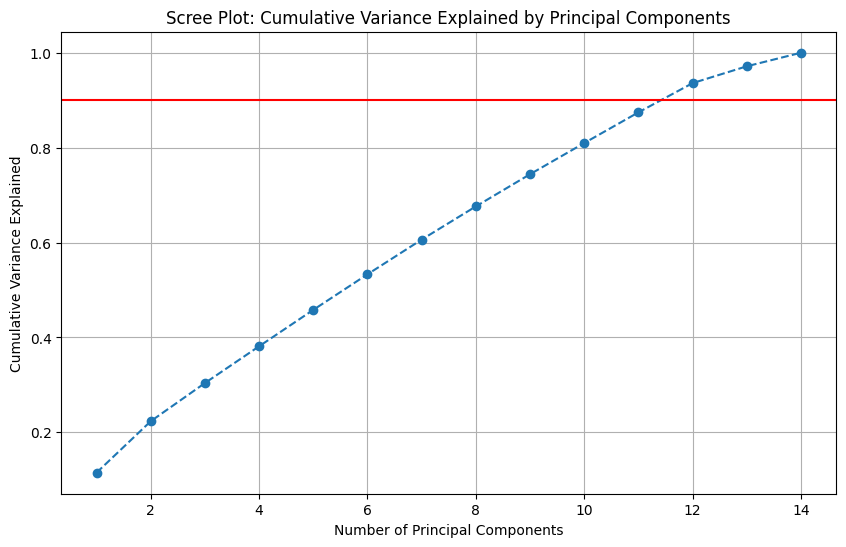

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import mlflow
import os

# DagsHub MLFlow Setup
#mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Set experiment name
experiment_name = "PCA_Dimensionality_Reduction"
mlflow.set_experiment(experiment_name)

# Ensure the target column exists
target_column = 'PriceRange'
if target_column not in df.columns:
    raise KeyError(f"Target column '{target_column}' not found in dataset!")

# Define X (features) and y (target)
X = df.drop(target_column, axis=1)
y = df[target_column]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Start an MLFlow run
with mlflow.start_run():
    # Apply PCA
    pca = PCA()
    X_pca = pca.fit_transform(X_scaled)

    # Log explained variance ratio
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance = explained_variance_ratio.cumsum()
    mlflow.log_param("explained_variance_ratio", explained_variance_ratio.tolist())
    mlflow.log_param("cumulative_variance", cumulative_variance.tolist())

    # Scree plot
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance, marker='o', linestyle='--')
    plt.title("Scree Plot: Cumulative Variance Explained by Principal Components")
    plt.xlabel("Number of Principal Components")
    plt.ylabel("Cumulative Variance Explained")
    plt.axhline(y=0.90, color='r', linestyle='-')  # Mark the 90% variance line
    plt.grid()

    # Save scree plot as an artifact
    plt.savefig("scree_plot.png")
    mlflow.log_artifact("scree_plot.png")

    # Determine the number of components to retain (90% variance explained)
    n_components = next(i for i, cumulative in enumerate(cumulative_variance) if cumulative >= 0.9) + 1
    mlflow.log_param("n_components_selected", n_components)

    # Transform the dataset with the selected number of components
    pca_final = PCA(n_components=n_components)
    X_reduced = pca_final.fit_transform(X_scaled)

    # Save the reduced dataset
    X_reduced_df = pd.DataFrame(X_reduced, columns=[f"PC{i+1}" for i in range(n_components)])
    X_reduced_df.to_csv("X_reduced.csv", index=False)
    mlflow.log_artifact("X_reduced.csv")

    # Log final dataset details
    mlflow.log_param("final_dataset_shape", X_reduced_df.shape)

    print(f"PCA completed with {n_components} components.")
    print("Explained variance ratio per component:", explained_variance_ratio)
    print("Cumulative variance explained:", cumulative_variance)


EX-**6**- Design and execute a custom experiment. Log results in MLFlow.

The results suggest that SMOTE didn't lead to a significant improvement, likely because the original dataset's class imbalance wasn't severe enough to require oversampling.



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, classification_report
from imblearn.over_sampling import SMOTE
import mlflow
import pandas as pd
import os


# Experiment Name
experiment_name = "SMOTE_vs_Original"
mlflow.set_experiment(experiment_name)

# Define target and features
X = df.drop('PriceRange', axis=1)
y = df['PriceRange']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Start MLFlow run
with mlflow.start_run():
    # Baseline Model on Original Data
    rf_original = RandomForestClassifier(random_state=42)
    rf_original.fit(X_train, y_train)

    y_pred_original = rf_original.predict(X_test)
    accuracy_original = accuracy_score(y_test, y_pred_original)
    f1_original = f1_score(y_test, y_pred_original, average='weighted')

    # Log results for baseline
    mlflow.log_metric("accuracy_original", accuracy_original)
    mlflow.log_metric("f1_score_original", f1_original)

    # Apply SMOTE
    smote = SMOTE(random_state=42)
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

    # Model on Balanced Data
    rf_smote = RandomForestClassifier(random_state=42)
    rf_smote.fit(X_train_smote, y_train_smote)

    y_pred_smote = rf_smote.predict(X_test)
    accuracy_smote = accuracy_score(y_test, y_pred_smote)
    f1_smote = f1_score(y_test, y_pred_smote, average='weighted')

    # Log results for SMOTE
    mlflow.log_metric("accuracy_smote", accuracy_smote)
    mlflow.log_metric("f1_score_smote", f1_smote)

    # Log Class Distribution
    mlflow.log_param("original_class_distribution", y_train.value_counts().to_dict())
    mlflow.log_param("smote_class_distribution", pd.Series(y_train_smote).value_counts().to_dict())

    # Log Model
    mlflow.sklearn.log_model(
        sk_model=rf_smote,
        artifact_path="SMOTE_RandomForest",
        registered_model_name="SMOTE_RF"
    )

    # Output comparison
    print("Baseline Model Performance:")
    print(f"Accuracy: {accuracy_original:.4f}, F1 Score: {f1_original:.4f}")

    print("\nSMOTE Model Performance:")
    print(f"Accuracy: {accuracy_smote:.4f}, F1 Score: {f1_smote:.4f}")


2024/12/20 19:02:42 INFO mlflow.tracking.fluent: Experiment with name 'SMOTE_vs_Original' does not exist. Creating a new experiment.
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
2024/12/20 19:02:48 WARNING mlflow.models.model: Mo

Baseline Model Performance:
Accuracy: 0.8512, F1 Score: 0.8523

SMOTE Model Performance:
Accuracy: 0.8465, F1 Score: 0.8485
🏃 View run persistent-crow-837 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/9/runs/393a46878f1a45238742bfa8d08d778b
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/9


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score
import mlflow

# Start MLFlow Run
with mlflow.start_run():
    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    }

    # GridSearchCV
    grid_search = GridSearchCV(
        estimator=RandomForestClassifier(random_state=42),
        param_grid=param_grid,
        scoring='accuracy',
        cv=3,
        n_jobs=-1,
        verbose=1
    )
    grid_search.fit(X_train, y_train)

    # Best model and evaluation
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Log parameters and metrics
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("f1_score", f1)

    # Save model
    mlflow.sklearn.log_model(
        sk_model=best_model,
        artifact_path="RandomForest_Tuned",
        registered_model_name="Tuned_RF"
    )

    print("Best Parameters:", grid_search.best_params_)
    print(f"Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}")


Fitting 3 folds for each of 36 candidates, totalling 108 fits


2024/12/20 19:07:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Successfully registered model 'Tuned_RF'.
2024/12/20 19:07:56 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Tuned_RF, version 1
Created version '1' of model 'Tuned_RF'.


Best Parameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 150}
Accuracy: 0.8791, F1 Score: 0.8804
🏃 View run incongruous-flea-308 at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/9/runs/014d2d34a77e4e73b226b0229353f612
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/9


**Create meaningful F1-score plots to compare experiments and determine the best model.**

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression: F1_Score = 0.6415, Accuracy = 0.6372
🏃 View run Logistic Regression at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11/runs/88c60d5261234cd783f1c932538d6c6f
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11
Random Forest: F1_Score = 0.8523, Accuracy = 0.8512
🏃 View run Random Forest at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11/runs/3d4659d9921e47b1af8c15fa76aa2bfe
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11
Ridge Classifier: F1_Score = 0.5181, Accuracy = 0.6000
🏃 View run Ridge Classifier at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11/runs/50c2c28fd7e340158721ba8d55815a01
🧪 View experiment at: https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow/#/experiments/11


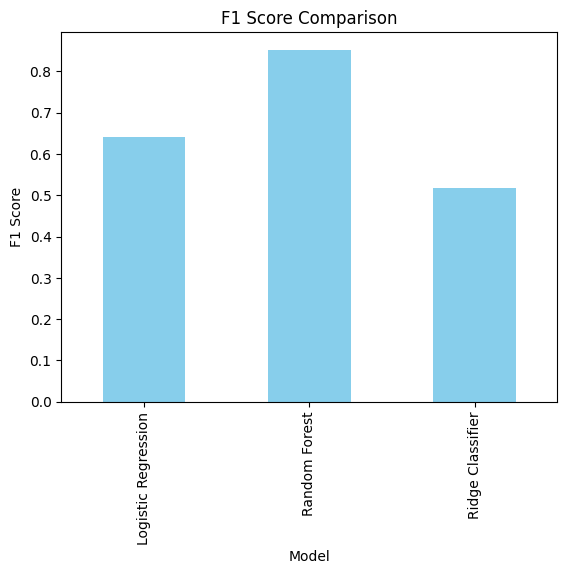

In [ ]:
import mlflow
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score
import pandas as pd

# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Ridge Classifier": RidgeClassifier(random_state=42)
}

# Placeholder for results
results = []

# Log results in MLFlow
MLFLOW_TRACKING_URI = "https://dagshub.com/pooja-vinod/Machile_learning_Project.mlflow"
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
experiment_name = "F1_Score_Comparison"
mlflow.set_experiment(experiment_name)

for model_name, model in models.items():
    with mlflow.start_run(run_name=model_name):
        # Train the model
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)

        # Calculate metrics
        f1 = f1_score(y_test, y_pred, average='weighted')
        accuracy = accuracy_score(y_test, y_pred)

        # Log metrics
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("Accuracy", accuracy)
        mlflow.log_param("Model", model_name)

        # Store results for visualization
        results.append({"Model": model_name, "F1_Score": f1, "Accuracy": accuracy})

        print(f"{model_name}: F1_Score = {f1:.4f}, Accuracy = {accuracy:.4f}")

# Convert results to DataFrame for visualization
results_df = pd.DataFrame(results)

# Plot F1 scores
results_df.plot(kind='bar', x='Model', y='F1_Score', legend=False, color='skyblue')
plt.title("F1 Score Comparison")
plt.ylabel("F1 Score")
plt.xlabel("Model")
plt.show()

# Log the final results DataFrame as an artifact in MLFlow
results_df.to_csv("model_comparison.csv", index=False)
mlflow.log_artifact("model_comparison.csv")


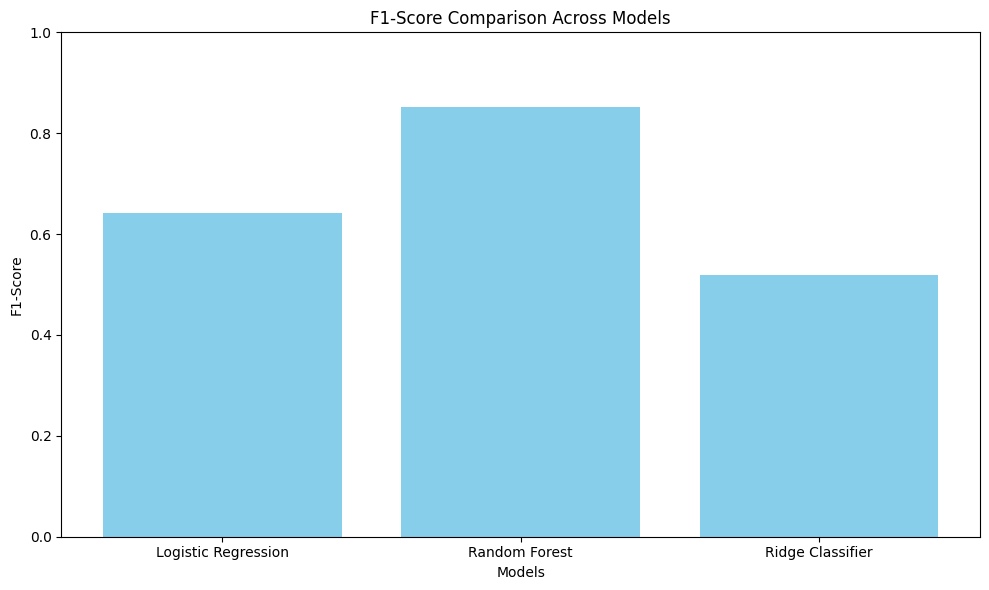

In [ ]:
# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Plot F1-Score Comparison
plt.figure(figsize=(10, 6))
plt.bar(results_df["Model"], results_df["F1_Score"], color="skyblue")
plt.title("F1-Score Comparison Across Models")
plt.xlabel("Models")
plt.ylabel("F1-Score")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()


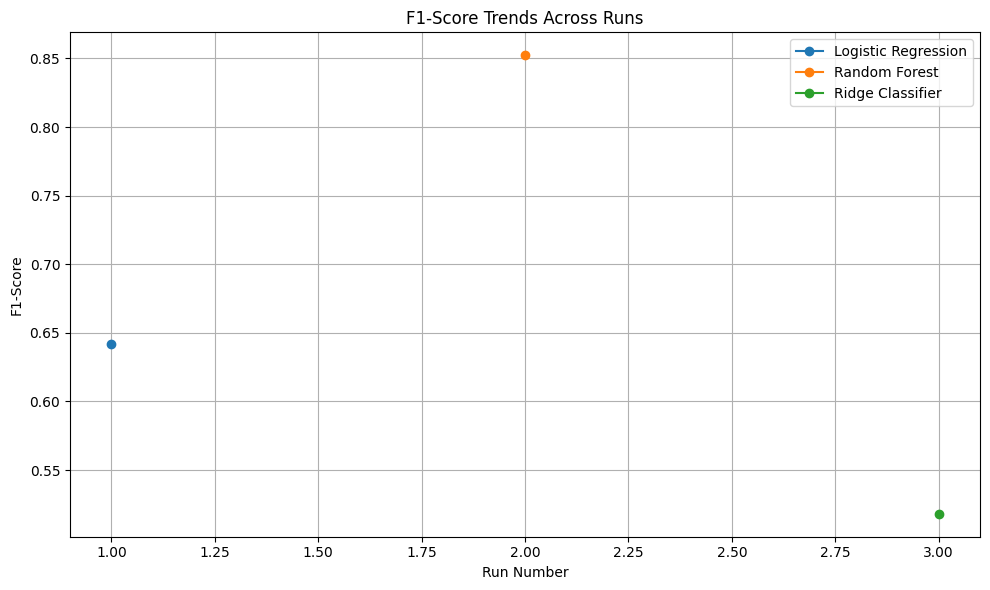

In [ ]:
# Sample Data for Multiple Runs
results_df["Run"] = range(1, len(results_df) + 1)

# Line Plot
plt.figure(figsize=(10, 6))
for model_name in results_df["Model"].unique():
    model_data = results_df[results_df["Model"] == model_name]
    plt.plot(model_data["Run"], model_data["F1_Score"], marker="o", label=model_name)

plt.title("F1-Score Trends Across Runs")
plt.xlabel("Run Number")
plt.ylabel("F1-Score")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


In [ ]:
best_model = results_df.loc[results_df["F1_Score"].idxmax()]
print(f"Best Model: {best_model['Model']}")
print(f"F1-Score: {best_model['F1_Score']:.4f}")


Best Model: Random Forest
F1-Score: 0.8523


In [ ]:
import joblib

# Save the trained model to a .joblib file
joblib.dump(best_model, "final_model.joblib")
print("Model saved as final_model.joblib")


Model saved as final_model.joblib


In [ ]:
#!pip install fastapi uvicorn joblib
#!pip install fastapi uvicorn joblib numpy

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
import joblib
import numpy as np

# Load the saved model
model = joblib.load("final_model.pkl")

# Initialize FastAPI app
app = FastAPI()

# Define request schema
class PredictionRequest(BaseModel):
    features: list

# Define endpoint
@app.post("/predict")
def predict(data: PredictionRequest):
    features = np.array(data.features).reshape(1, -1)
    prediction = model.predict(features)
    return {"prediction": int(prediction[0])}

# Root endpoint for health check
@app.get("/")
def root():
    return {"message": "Model API is live!"}



In [ ]:
import joblib
import pandas as pd
import json

# Step 1: Load the model
model = joblib.load("model_RF.pkl")
print("Model loaded successfully!")
print(model)
# Step 2: Load and prepare input data
with open("input_example.json", "r") as f:
    input_data = json.load(f)

# Convert JSON to Pandas DataFrame
columns = input_data["columns"]
data = input_data["data"]
df = pd.DataFrame(data, columns=columns)

print(f"Input Data:\n{df.head()}")

# Step 3: Make predictions
predictions = model.predict(df)
print("Predictions:", predictions)

# (Optional) Save predictions to a file
df["Predictions"] = predictions
df.to_csv("predictions.csv", index=False)
print("Predictions saved to 'predictions.csv'")



Model loaded successfully!
RandomForestClassifier(max_depth=20, min_samples_split=5, n_estimators=150,
                       random_state=42)
Input Data:
   BatteryPower  MobileWeight  DualSim  FourG  ThreeG  TouchScreen  Wifi  \
0          1890           127        0      1       1            0     1   
1          1191           169        1      0       1            1     1   
2          1358           135        1      0       0            0     1   
3          1314           116        0      1       1            1     1   
4          1112           190        0      1       1            1     1   

   Bluetooth  ClockSpeed  IntMemory  NCores  PxHeight  PxWidth   RAM  
0          0         1.1         48       4      1438     1832  2392  
1          0         2.4         13       1       179     1813  1028  
2          0         2.5         20       7      1485     1655  3406  
3          1         2.2         40       7       328     1858  3033  
4          0         0.5         

In [ ]:
# Save app.py in Colab
with open("app.py", "w") as f:
    f.write('''
from fastapi import FastAPI
from pydantic import BaseModel
import joblib
import numpy as np

# Load the saved model
model = joblib.load("final_model.joblib")

# Initialize FastAPI app
app = FastAPI()

# Define the input schema
class PredictionRequest(BaseModel):
    features: list

# Define the prediction endpoint
@app.post("/predict")
def predict(data: PredictionRequest):
    features = np.array(data.features).reshape(1, -1)
    prediction = model.predict(features)
    return {"prediction": int(prediction[0])}

# Health check endpoint
@app.get("/")
def root():
    return {"message": "API is live and ready to predict!"}
    ''')
print("app.py has been created in the current directory.")


app.py has been created in the current directory.
